# Multilayer Perceptron in PyTorch

## Introduction

### Goal
Learn the basics of PyTorch (PT) by working on an artificial classification problem.

### Plan
In this tutorial we will create a set of synthetic data that we will use as an example problem.
Then we will create a MLP model and learn its parameters from the data. Finally we will visualize the different learning measures and the parameters of the model.

In a second part we will modify our data and adapt the hyper-parameters (e.g. number of hidden neurons) of our model to allow better classification.

In the next part we will use the basic functions of PT to understand our process and how PT works. But we will also mention the high level features and aids of PT that facilitate our tasks.


### Usage
 
 * Respond to exercices in the next cells.
 * Write your code in between the lines:
 
```
### BEGIN SOLUTION


### END SOLUTION
```

 * You will provide this same notebook completed for assessment.

### Requirements

Python >=3.5

Modules python:
- pytorch >=1.0
- numpy
- matplotlib

### Evaluation considerations
- We take into account the correctness of the solutions but also their generality and quality of the code
- Comment and discuss on the results of all your exercises (in a cell immediately after the results). You may also state the difficulties encountered, lessons learned and your understanding of the problem and solution
- Clean-up your code before submission, do not leave unnecessary code attempts, or if you deem it important, leave them in a way that it is easily understood and with comments/discussion
- We also value the originality of the solutions, don't hesitate in performing unrequested additional tasks in relation to the exercises
- Non-advanced exercises will account for approx. 14/20 of the grade. Advanced exercises will contribute to the remaining score and may compensate for errors in the non-advanced ones
- You may receive help from colleagues on the non-advanced questions, but you must state who has helped you. Approximately 1/20 of the grade is assigned to those that help most.

In [118]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
np.random.seed(42)

## 0. With a little help from my friends

Write in the following cell the colleagues (if any) that have helped you with this lab assignment (comma separated if more than one and don't state more than 2).

## 1. Data generation

In this part, we will generate a data set of 1000 points which is not linearly separable.

#### Create the artificial data sets



### Exercise 1

Create 1000 points of 2 dimensions $(x_0, x_1)$ with their coordinates between 0 et 1 $x_0, x_1 \in [0, 1]$.



In [119]:
### BEGIN SOLUTION

x = torch.rand(1000,2) #creates random data in 0-1 range
# 1000 data points is 1000 rows and 2 column is for x0(first col) and x1(second col) of datapoints
print(x)
### END SOLUTION

tensor([[0.8946, 0.7318],
        [0.5269, 0.8306],
        [0.7421, 0.6266],
        ...,
        [0.3932, 0.2628],
        [0.7251, 0.8596],
        [0.7979, 0.5981]])


***We use torch.rand function to generate random data points which are between 0 and 1. Here every rows in the tensor represents a new data point and the columns represent the dimension of the data points. So it has 1000 data points and 2 features for every point***


### Exercise 2

Assign to each point a binary class $y$ (0 ou 1) following the condition: 
$$
y = \begin{cases}
1 &\text{if $x_0 > 0.2$ et $x_1 > 0.4$}\\
0 &\text{else}
\end{cases}
$$


In [120]:
### BEGIN SOLUTION
y = torch.zeros(1000,1) #taking a zero vector of 1000 rows we will modify this to create the binary class

for index,data_points in enumerate(x):
    #check the condition given and assign 1 to the index of y=1 if the conditions is true
    if data_points[0]>0.2 and data_points[1]>0.4:
        y[index] = 1


### END SOLUTION

***First we initialize a tensor of 1000 zeros. Here 1000 is the number of data points. Every point that has the first parameter greater than 0.2 and the next one greater than 0.4 is labeled as 1 and all the other points are kept at 0.***


### Exercise 3

Create a matrix of data `data` with shape `(1000, 3)` with a point per row, the two first columns contain the points coordinates $(x_0, x_1)$ the last column contains the class $y$.


In [121]:
### BEGIN SOLUTION
data = torch.cat((x,y),dim = 1) #concat the x and y horizontally to get a 3 col data
data.size()
### END SOLUTION

torch.Size([1000, 3])

***Here we are using the concatanation method to create the dataset using x and y. We are concatanating with the 1st dimension***


### Exercise 4

Split the data into 3 sets (on matrix for each): 800 points for `train`, 100 points for `valid` and 100 for `test`


In [122]:
### BEGIN SOLUTION
#taking the first 800 points as train, next 100 as validation and next 100 as test as they are already created randomly

train = data[:800,:]
print(train.size())

valid = data[800:900,:]
print(valid.size())

test = data[900:,:]
print(test.size())
### END SOLUTION

torch.Size([800, 3])
torch.Size([100, 3])
torch.Size([100, 3])


***We take the the first 800 rows and all columns as training data. The next 100 rows and all columns as validation data, and the last 100 rows and all columns as testing data***

### Exercise 5

Visualise the data using a scatter plot (`plt.scatter`).


We expect to find something similar to this:

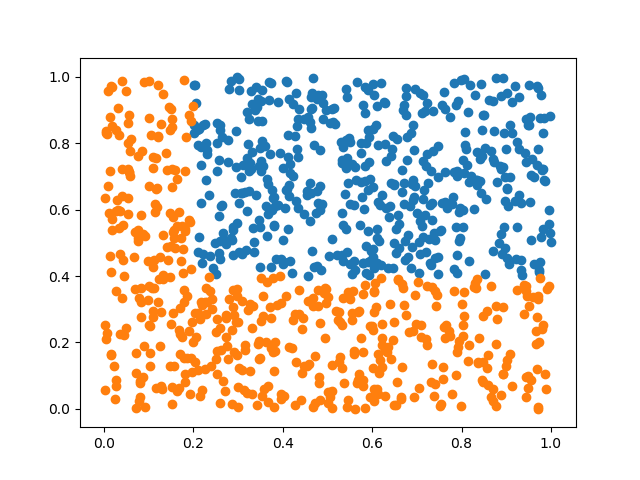

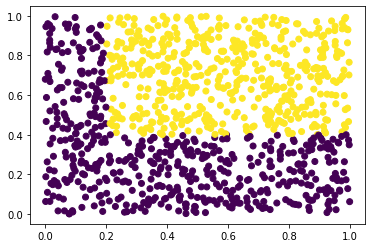

In [123]:
# Generate, split and plot the data
### BEGIN SOLUTION
plt.scatter(data[:,0], data[:,1], c=data[:,2]) 
#plotting all the rows and the color is dependent on the label which is the 3rd column

### END SOLUTION

***we are using scatter plot to plot all the data. And to determine the color of the points we are using the label or the last column of the data. From the figure we can see that the dataset is consistent with the required dataset asked in the question.***

**Run the following cell to make sure you have done the previous exercises correctly.**

In [124]:
# Verification des dimensions des donnees
assert data.shape == (1000, 3)

# Verification des division desd donnees
assert train.shape == (800, 3)
assert valid.shape == (100, 3)
assert test.shape == (100, 3)

for dataset in [train, valid, test]:
    # Verification des classes
    assert (dataset[dataset[:,-1]==1,0] > 0.2).all()
    assert (dataset[dataset[:,-1]==1,1] > 0.4).all()
    assert ((dataset[dataset[:,-1]==0,0] <= 0.2) | (dataset[dataset[:,-1]==0,1] <= 0.4)).all()
    
print('Everything looks good!')

Everything looks good!


## 2. Creating the model
In this part, we will create, with PyTorch, a model to predict the class $y$ of a point using only its coordinates $(x_0, x_1)$.

The model we will create to classify the data is a Multilayer Perceptron with a single hidden layer:

\begin{align}
h_1 &= \sigma(x W_1 + b_1) \\
\hat{y} &= \sigma(h_1 W_2 + b_2) \\
& \textrm{ avec } & \\
\sigma(t) &= \frac{1}{1+e^{-t}}
\end{align}

$\hat{y}$ will the model's estimation for the class of the point.



### Exercise 6
What are the model parameters?


***The model parametes are W1,W2,b1,b2.
We have to optimize these values*** 

*Implementation en PyTorch*

First we will do a low level implementation where we will only use the AutoDiff feature (which allows to automatically compute gradients) of PyTorch.

PyTorch as une API similaire a celle de numpy. La grande difference etant que pour les symbols pour lesquels on voudra avoir un gradient, nous devons inclure l'argument nommé `requires_grad=True`.

For example $W_1$ is a parameter of the model and we are interested in the gradient of the loss with respect to this symbol. So at initialization time we will add `requires_grad=True`.



### Exercise 7

What the dimensions of each of these symbols: $x, y, W_1, b_1, W_2, b_2$?


In [125]:
'''
dimension of x is (1,2)
dimension of W1 is (2,H)
#2 is the input neurons here
#where H is the number of neuron in the next layer
dimension of b1 is (1,H)
#which is also the dimension of h 

dimension of W2 is (H,1)  #as h has H columns and b2 has (1,1) shape
dimension of b2 is (1,1).  #As it has to be the dimension of the output or label.
dimension of yhat is (1,1) # which is the dimension of the label of a data point


dimension of b2 is (1,1)
'''

'\ndimension of x is (1,2)\ndimension of W1 is (2,H)\n#2 is the input neurons here\n#where H is the number of neuron in the next layer\ndimension of b1 is (1,H)\n#which is also the dimension of h \n\ndimension of W2 is (H,1)  #as h has H columns and b2 has (1,1) shape\ndimension of b2 is (1,1).  #As it has to be the dimension of the output or label.\ndimension of yhat is (1,1) # which is the dimension of the label of a data point\n\n\ndimension of b2 is (1,1)\n'


### Exercise 8
Create a function that initializes and returns a tuple with the MLP  parameters.


In [126]:
# Create the model
### BEGIN SOLUTION
def init_mlp(inp, hid, outp):
    W1 = torch.rand(inp,hid,  requires_grad=True)
    b1 = torch.rand(1,hid,  requires_grad=True)

    W2 = torch.rand(hid,outp,  requires_grad=True)
    b2 = torch.rand(1,outp,  requires_grad=True)
    return (W1, b1, W2, b2)
### END SOLUTION

params = init_mlp(2, 2, 1)


***Here in the init_nlp function we are initializing the model parameters with random values and with required shape. We are also declating that these parameters needs gradient as we will use gradient of the loss function with respect to these parameters during the training of the model***

*Run a forward pass of the model on the following data points*

### Exercise 8
What is the desired response for the following points?
$$(0.1, 0.5), (0.3, 0.5), (0.3, 0.15), (0.1, 0.15)$$



**for point (0.1, 0.5)**
the output should be 0

**for point (0.3, 0.5)**
the output should be 1

**for point (0.3, 0.15)**
the output should be 0

**for point (0.1, 0.15)**
the output should be 0

### Exercise 9
Execute the model on the previous points and print $\hat{y}$


In [127]:
### BEGIN SOLUTION  
# Create a function sigmoid(t) that computes the sigmoid function on t
def sigmoid(t):
    y = 1/(1+torch.exp(-t))
    return y
# Create a function mlp(x, params) that computes the MLP outputs given the inputs x

def mlp(x, params):
    W1 = params[0]
    W2 = params[2]
    b1 = params[1]
    b2 = params[3]
    h = torch.matmul(x,W1) + b1
    
    h = sigmoid(h)
    o = torch.matmul(h,W2) + b2
    y = sigmoid(o)
    return y

# Create a tensor containing the previous points
p1 = torch.tensor([0.1, 0.5])
p2 = torch.tensor([0.3, 0.5])
p3 = torch.tensor([0.3, 0.15])
p4 = torch.tensor([0.1, 0.15])
#p = torch.tensor([[0.1, 0.5,0],[0.3, 0.5,1],[0.3, 0.15,0],[0.1, 0.15,0]])
#q = torch.tensor([0,1,0,0])
# Call and print output of mlp(points, params) (NOTE: use torch.no_grad())
with torch.no_grad():
    print(mlp(p1, params))
    print(mlp(p2, params))
    print(mlp(p3, params))
    print(mlp(p4, params))
### END SOLUTION

tensor([[0.7344]])
tensor([[0.7397]])
tensor([[0.7317]])
tensor([[0.7260]])


***Here we can see that the yhats are very random from what we expected. As the model is not trained and the parameters are completely random, it is what is expected of the model before training***

We can observe that the results are not good, because they are far from the expected result.

If we want to compute on our test data the performance of the model we will define an accuracy function, which takes a decision for each data based on $\hat{y}$ and compares it to $y$.

$$
\text{accuracy} = \frac{1}{N} \sum_i^N (1 - abs(y - round(\hat{y}_i))) 
$$

The accuracy represents the rate of correctly classified points. It will be $1$ if all points are correctly classified, $0$ if all are misclassified and $0.5$ if half are well classified.



### Exercise 10

Implement the accuracy using Pytorch functions `torch.mean`, `torch.abs`, `torch.round`.


In [128]:
def accuracy(estimated, reference):
    ### BEGIN SOLUTION
    
    #rounding the estimated value to get the prediction
    #squeezing to make the shape same 
    estimated = torch.round(estimated).squeeze()
    reference = reference.squeeze()
    
    
    accuracy = torch.mean(torch.tensor([1]) - torch.abs(reference - estimated))
    
    return accuracy
    ### END SOLUTION

***We are computing the accuracy of the prediction here in this function. First we are rounding the predictions to become 0 or 1 as this is what the labels look like in our dataset. Then we squeeze the reference to make sure that the estimated and the reference both tensor has the same shape. Other wise it would create error.
after that we calculate the accuracy and return it.***

### Exercise 11

Write a `score_model` function that evaluates the performance (accuracy) of the model on a given data set. Print the result 


In [129]:
def score_model(params, data):
    ### BEGIN SOLUTION
    score = accuracy(mlp(data[:,:2], params), data[:,2])
    return score
    ### END SOLUTION

acc = score_model(params, train).item()

print(f'score train: {acc:.2%}')

score train: 50.38%


***in this function we calculate the score which in this case accuracy and print it, given the data and the parameters of the model. The result is exepected to be around 50 percent with a random prediction model***

### Exercise 12
Do the same with `valid` and `test`


In [130]:

print(f'score valid: {score_model(params, valid):.2%}')
print(f'score test: {score_model(params, valid):.2%}')


score valid: 45.00%
score test: 45.00%


***Here we are doing the same prediciton of the model on the testing and validation data.***

### Exercise 13

Explain the results.

**As we have not trained the model yet, the model parameters are randomly initialized. So the prediction it is making is just random prediction. We can expect the accuracy of a random prediction to be around 50 percent. which can be seen in the previsous cells for train, validation and testing dataset.**

## 4. Training the model

To find the best parameters for our model we will enter it with the training data. For this we will define a cost function to optimize.

As we are trying to solve a binary classification task, we will use the crossentropy cost function:

$$
L = \sum -y \log(\hat{y}) - (1-y) \log(1-\hat{y})
$$



### Exercise 14
Implement the cost function in PyTorch.


In [131]:
def bce(est, ref):
    ### BEGIN SOLUTION
    L = -ref*torch.log(est)-(1-ref)*torch.log(1-est)
    L = torch.sum(L)
    return L
    ### END SOLUTION


***In this function we compute the binary crossentropy loss between estimation and the reference value***

To train our model by means of Gradient Descent (GD) we will iteratively update with small increments our parameters:

\begin{align}
W_1^n &= W_1^{n-1} - \eta \frac{\delta L}{\delta W_1} \\
b_1^n &= b_1^{n-1} - \eta \frac{\delta L}{\delta b_1} \\
W_2^n &= W_2^{n-1} - \eta \frac{\delta L}{\delta W_2} \\
b_2^n &= b_2^{n-1} - \eta \frac{\delta L}{\delta b_2}
\end{align}

Where $\eta$ is our learning rate.

We need to calculate the gradients:
$$
\frac{\delta L}{\delta W_1}, \frac{\delta L}{\delta b_1}, \frac{\delta L}{\delta W_2}, \frac{\delta L}{\delta b_2}
$$

For the gradients of the cost function with respect to the parameters, we could calculate them by hand. But we are lazy. So we will use PyTorch `error.backward()` will do this for us in an optimized way using Dynamic Programming (DP) and populate the tensors with the gradients.

Finally we will run a training of 10 `epochs` with a `batch_size=100`.
For this we will do the following steps:
1. Calculate the number of iterations (`n_iterations`) per epoch (remember that an iteration is an update of the parameters and an epoch is a competing use of all our training data)
2. Create a session
3. Initialize the variables
4. For each epoch (`for epoch in range(n_epochs):`)
    1. Randomly reorder the `train` data (use `torch.randperm()`)
    2. Evaluate and print the model score on the training data
    3. For each iteration (`for iteration in range(n_iterations):`)
        1. Select a block of `batch_size` examples
        2. *Zero the gradients*
        3. Run the forward pass on the model (`mlp()`)
        4. Compute the loss (`bce()`)
        5. Compute the gradients
        6. *Update the parameters doing gradient descent*

**Note:** Remember that PyTorch keeps track of all the operations you make with tensors to build the DAG graph. In some cases we want to avoid that, such as when setting the gradients to zero or performing the gradient descent update of the parameters. In those cases we may encapsulate the operations inside a `with torch.no_grad():` context clause. Furthermore the `grad` attribute of the tensors, may be `None` (no need to set to zero in this case) during the first run so one may do:

```
with torch.no_grad():
    if param.grad is not None:
        param.grad.zero_()

```

**Note:** When performing the parameter update of gradient descent, make sure not to reassign to the parameter a new tensor object. To avoid doing so use an inplace operation:

```
with torch.no_grad():
    param -= eta * param.grad
```

If you erronously do this `param = param - eta * param.grad`, `param` will point to a new tensor, not the original parameters of the model.

**Note:** Zero the gradients means accessing the gradient of each parameter and setting it to zero. We need this because PyTorch `.backward()` method accumulates the gradients instead of replacing them.
    


### Exercise 15

Implement and run a train loop for the model.

In [132]:
def train_model(params, data, eta=0.05, n_epochs=1, batch_size=16):
    n_data = data.shape[0]
    n_iterations = n_data // batch_size
    
    ### BEGIN SOLUTION
    # 1. Zero the gradients of each of the parameters because .bacward() accumulates them
    with torch.no_grad():
        for param in params:
            if param.grad is not None:
                param.grad.zero_()
                            
    # 2. Run the forward pass on the model
    
    for epoch in range(n_epochs):
        #randomizing the data
        r = torch.randperm(data.size(0))
        data = data[r]
        
        print(f'epoch {epoch}')
        print(f'score (train): {score_model(params, data)}')
        for iteration in range(n_iterations):
            #selecting batch
            try:
                train = data[batch_size * iteration:iteration*batch_size + batch_size]
            
            except:
                train = data[batch_size * iteration:]
            
            
            for param in params:
                if param.grad is not None:
                    param.grad.zero_()

            #forward pass
            y_pred = mlp(train[:,:2], params).squeeze()
            
            # 3. Compute the error
            loss = bce(y_pred, train[:,2])
            
            # 4. Compute the gradients
            loss.backward()
              
            # 5. Update the parameters using their gradients
            with torch.no_grad():
                for param in params:
                    
                    param -= eta * param.grad
                    param.grad.zero_()
                
    print(f'score valid: {score_model(params, valid):.2%}')
    print(f'score test: {score_model(params, valid):.2%}')


### END SOLUTION

params = init_mlp(2, 2, 1)           
train_model(params, train, eta=0.05, n_epochs=100, batch_size = 16)

epoch 0
score (train): 0.5037500262260437
epoch 1
score (train): 0.5037500262260437
epoch 2
score (train): 0.84375
epoch 3
score (train): 0.8587499856948853
epoch 4
score (train): 0.8600000143051147
epoch 5
score (train): 0.862500011920929
epoch 6
score (train): 0.8424999713897705
epoch 7
score (train): 0.8550000190734863
epoch 8
score (train): 0.8537499904632568
epoch 9
score (train): 0.8612499833106995
epoch 10
score (train): 0.856249988079071
epoch 11
score (train): 0.8550000190734863
epoch 12
score (train): 0.8525000214576721
epoch 13
score (train): 0.862500011920929
epoch 14
score (train): 0.856249988079071
epoch 15
score (train): 0.862500011920929
epoch 16
score (train): 0.8525000214576721
epoch 17
score (train): 0.8587499856948853
epoch 18
score (train): 0.8587499856948853
epoch 19
score (train): 0.8600000143051147
epoch 20
score (train): 0.8575000166893005
epoch 21
score (train): 0.8612499833106995
epoch 22
score (train): 0.856249988079071
epoch 23
score (train): 0.860000014305

*Here we are training the model using gradient descent optimization and updating the model parameters in every epoch. And we can see that the accuracy score is increasing as the model is being trained on the training data.

**Faced Difficulties:** 
In this excercise I was struggling to increase the model accuracy with epoch altough the loss was decreasing. After long times I figured out that in the accuracy function, the shape of the predicted and the estimated labels are not same. So I had to squeeze one to make sure they were of same shape to solve the problem*

## 5. Visualizing the model

To monitor the evolution of the learning of our model, we will visualize the value of the cost function, the classification score and the parameters of the first layer of our model.  

We will run our experiments with different values of the following hyperparameters to better understand their effect:
- `learning_rate`
- `batch_size`


**Visualization of the cost function**

The cost function is the value we aim to reduce with the training iterations. To visualize it we will create an empty list (`couts = []`) at the beginning of our training and we will add (`couts.append(cout)`) the value resulting from the cost at each iteration. At the end of the training we will visualize the curve (`plt.plot(costs)`).

### Exercise 16
Rewrite the `train_model` function so that it returns the average loss of every epoch. Run it and plot the loss of a training procedure. While we are at it, make the printing optional with an additional keyword argument.

Text(0, 0.5, 'loss')

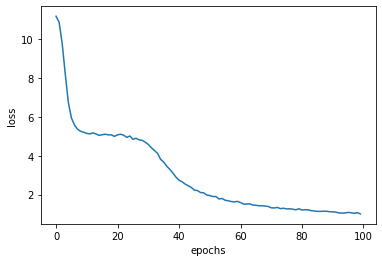

In [133]:
def train_model(params, data, eta=0.05, n_epochs=1, batch_size=16,show_every_epoch_result=False, valid = None, Test = None):
    n_data = data.shape[0]
    n_iterations = n_data // batch_size
    loss_series = []
    acc_series = []
    
    val_acc_series = []
    test_acc_series = []
    for epoch in range(n_epochs):
        ### BEGIN SOLUTION
        # Randomly reorder the `train` data (use `torch.randperm()`)
        r = torch.randperm(data.size(0))
        data = data[r]
        if show_every_epoch_result:
            print(f'epoch {epoch}')
            print(f'score (train): {score_model(params, data)}')

        acc_series.append(score_model(params, data))
        if valid!=None:
            val_acc_series.append(score_model(params, valid))
        if test!=None:
            test_acc_series.append(score_model(params, test))
        
        # Evaluate and print the model score on the training data
        ### END SOLUTION    
        running_loss = 0
        for iteration in range(n_iterations):
            ### BEGIN SOLUTION

            try:
                train = data[batch_size * iteration:iteration*batch_size + batch_size]
            
            except:
                train = data[batch_size * iteration:]
            
            
            for param in params:
                if param.grad is not None:
                    param.grad.zero_()
            y_pred = mlp(train[:,:2], params).squeeze()
            
            # 3. Compute the error
            loss = bce(y_pred, train[:,2])
            
            # 4. Compute the gradients
            loss.backward()
            running_loss += loss.item()
             
            # 5. Update the parameters using their gradients
            with torch.no_grad():
                #print(params[0])
                for param in params:
                    
                    param -= eta * param.grad
                    param.grad.zero_()
        
        if show_every_epoch_result:
            print(f'loss: {running_loss / n_iterations:.3f}')
        
        #storing the avg loss per epoch
        loss_series.append(running_loss / n_iterations)
        running_loss = 0.0 
    
    
    
    return loss_series, acc_series, val_acc_series, test_acc_series
            
params = init_mlp(2, 2, 1)                    
loss, acc, valid_acc, test_acc = train_model(params, train, eta=0.05, n_epochs=100)
plt.plot(range(100), loss)
plt.xlabel('epochs')
plt.ylabel('loss')

***In this excercise, the mean loss of every epoch was computed and stored. Then it was used to plot the learning curve of the training process. We can observe in the plot that as the model is learning the loss is decreasing***

**Effect of the learning rate**

We will run our learning with different learning rates to see its effect on the cost function.



### Exercise 17
Display the training loss curve for learning rates `[0.5, 0.05, 0.005, 0.0005]`

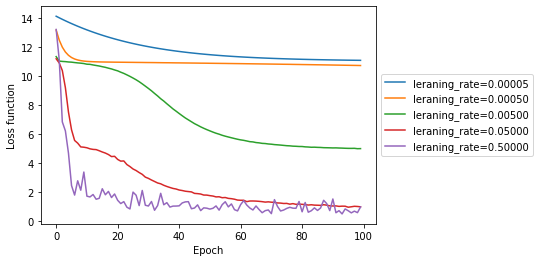

In [134]:
learning_rates = [0.5, 0.05, 0.005, 0.0005, 0.00005]
n_epochs = 100
batch_size = 16

losses = {}

# Train a model with each learning rate and populate losses with the learning rate as key and the loss series as values
### BEGIN SOLUTION
for learning_rate in learning_rates:
    params = init_mlp(2, 2, 1)                    
    loss,acc, valid_acc, test_acc = train_model(params, train, eta=learning_rate, batch_size = batch_size, n_epochs = n_epochs)
    losses[learning_rate] = loss
### END SOLUTION

plt.figure()
for lr, loss_curve in sorted(losses.items()):
    plt.plot(loss_curve, label=f'leraning_rate={lr:.5f}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('Loss function')
plt.xlabel('Epoch');

***Here we are varying the learning rate and observing the effect of learning rate on the learning process.
We can see the lower the learning rate is the smoother the plot is. Its because when we increase the learning rate the model might overshoot the  minima sometimes. But the problem with too low learning rate is it can get caught in a local minima. But if the learning rate is high it can overshoot those local minima and eventually reach a global minima. We can observe this in the larning curves with different learning rate.
The loss for lr = 0.5 and 0.05 goes much lower altough they are much noisier than their counter parts.***

**Effect of batch size**

We will now run our training with different batch sizes to see its effect on the cost function.

### Exercise 18

Display the cost function evaluated on all training data at each epoch for batch sizes `[n_data, 100, 50, 10, 5, 1]`


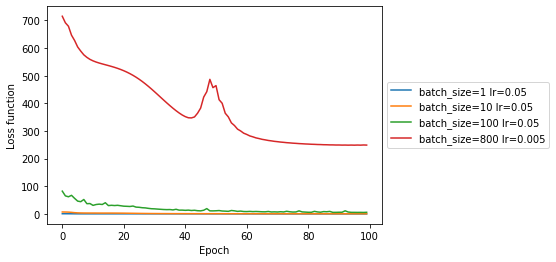

In [135]:
n_data = train.shape[0]

n_epochs = 100
batch_sizes = [n_data, 100, 10, 1]
lrs = [0.005, 0.05, 0.05, 0.05]

losses = {}

### BEGIN SOLUTION
for i in range(4):
    #initializing the parameters
    params = init_mlp(2, 2, 1)                    
    loss,acc, valid_acc, test_acc = train_model(params, train, eta=lrs[i], batch_size = batch_sizes[i], n_epochs = n_epochs)
    #storing the loss to plot later
    losses[( batch_sizes[i], lrs[i])] = loss
### END SOLUTION

# Visualiser les courbes de cout
plt.figure()
for (bs, lr), loss_curve in sorted(losses.items()):
    plt.plot(loss_curve, label=f'batch_size={bs} lr={lr}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('Loss function')
plt.xlabel('Epoch');

***Here we are varying the learning rate as well as the batch size and observing the effect of it on the learning process.***

**Visualization of the performance**

Another value worth monitoring is the classification accuracy of the model.



### Exercise 19

Visualize the accuracy on the train, valid and test data on each epoch

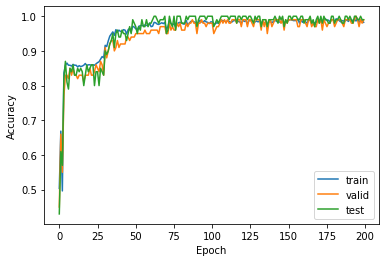

In [136]:
n_data = train.shape[0]

n_epochs = 200
batch_size = 10
learning_rate_value = 0.05

accuracies = {}

accuracies['train'] = []
accuracies['valid'] = []
accuracies['test'] = []

### BEGIN SOLUTION
params = init_mlp(2, 2, 1)
loss,acc,valid_acc,test_acc = train_model(params, train, eta=learning_rate_value, batch_size = batch_size, n_epochs = n_epochs, valid=valid, Test=test)  
accuracies['train'] = torch.tensor(acc)
accuracies['valid'] = torch.tensor(valid_acc)
accuracies['test'] = torch.tensor(test_acc)

accuracies['train'].requires_grad = False
accuracies['valid'].requires_grad = False
accuracies['test'].requires_grad = False
### END SOLUTION

plt.figure()
for split, v in accuracies.items():
    plt.plot(v, label=split)

plt.legend(loc='best')
plt.ylabel('Accuracy')
plt.xlabel('Epoch');

***Here we plot the accuracy on train, validation and test set every epoch. We can see altough the model is only learning on the training data, the accuracy is increasing consistently on all the data. We can say that the model is not overfitting.***

**Visualization of the model parameters**

For pedagogical reasons we will now visualize the parameters of the model with its geometrical interpretation.
We will represent the parameters of the first layer of the MLP as a line (the decision boundary).

In [137]:
def plot_decision_boundaries(w, b, ax=None, **kwargs):
    ax = ax or plt.gca()
    x0, x1 = ax.get_xlim()
    y0, y1 = ax.get_ylim()
    
    arts = []
    for i in range(w.shape[1]):
        w_i = w[:, i]
        if len(b.shape)==1:
            b_i = b[i]
        else:
            b_i = b[:, i]
        
        intersections = []
        
        if w_i[1] != 0:
            yx0 = -w_i[0]/w_i[1] * x0 - b_i/w_i[1]
            yx1 = -w_i[0]/w_i[1] * x1 - b_i/w_i[1]
            
            if y0 <= yx0 <= y1:
                intersections.append((x0, yx0))
            
            if y0 <= yx1 <= y1:
                intersections.append((x1, yx1))
            
        if w_i[0] != 0:
            xy0 = -w_i[1]/w_i[0] * y0 - b_i/w_i[0]
            xy1 = -w_i[1]/w_i[0] * y1 - b_i/w_i[0]
            
            if x0 <= xy0 <= x1:
                intersections.append((xy0, y0))
            
            if x0 <= xy1 <= x1:
                intersections.append((xy1, y1))

        if len(intersections) == 2:
            xs, ys = zip(*intersections)
            lines, = ax.plot(xs, ys, **kwargs)
        
            arts.append(lines)
    
    ax.set_xlim([x0, x1])
    ax.set_ylim([y0, y1])
    
    return arts
        
def plot_model_and_data(params, dat=None, sel=None, ax=None):
    w, b, _, _ = params
    ax = ax or plt.gca()
    ax.set_prop_cycle(None)
    prop_cycle = ax._get_patches_for_fill.prop_cycler

    import itertools
    props = list(itertools.islice(prop_cycle, 3))
    
    all_arts = []
    
    if dat is not None:
        arts = ax.scatter(dat[dat[:,-1]==1,0], dat[dat[:,-1]==1,1], 
                            facecolors='none', edgecolors=props[0]['color'], alpha=0.2)
        all_arts.append(arts)

        arts = ax.scatter(dat[dat[:,-1]==0,0], dat[dat[:,-1]==0,1], 
                            facecolors='none', edgecolors=props[1]['color'], alpha=0.2)
        all_arts.append(arts)
    
    if sel is not None:
        arts = ax.scatter(sel[sel[:,-1]==1,0], sel[sel[:,-1]==1,1], 
                            facecolors=props[0]['color'], edgecolors=props[0]['color'])
        all_arts.append(arts)

        arts = ax.scatter(sel[sel[:,-1]==0,0], sel[sel[:,-1]==0,1], 
                            facecolors=props[1]['color'], edgecolors=props[1]['color'])
        all_arts.append(arts)
    
    line_arts = plot_decision_boundaries(w.detach().numpy(), b.detach().numpy(),
                             ax=ax,
                             color=props[2]['color'],
                             linewidth=2.0)
    all_arts += line_arts
    
    return all_arts

You can use the two functions created above to visualize a learning animation. You simply get the value returned by the function `plot_model_and_data(params, sel=train, ax=ax)` after each epoch. 

```
art = plot_model_and_data(params, sel=train, ax=ax)
arts.append(art)
``` 



### Exercise 20
Visualise the decision boundaries during a training procedure.

/usr/local/lib/python3.8/dist-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


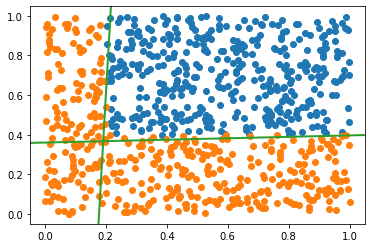

In [138]:
n_data = train.shape[0]

n_epochs = 250
batch_size = n_data#10
learning_rate_value = 0.05

arts = []
fig, ax = plt.subplots()

### BEGIN SOLUTION

def train_model(params, data, eta=0.05, n_epochs=1, batch_size=16,show_every_epoch_result=False, valid = None, Test = None):
    n_data = data.shape[0]
    n_iterations = n_data // batch_size
    loss_series = []
    acc_series = []
    
    val_acc_series = []
    test_acc_series = []
    arts = []
    for epoch in range(n_epochs):
        ### BEGIN SOLUTION
        # Randomly reorder the `train` data (use `torch.randperm()`)
        r = torch.randperm(data.size(0))
        data = data[r]
        if show_every_epoch_result:
            print(f'epoch {epoch}')
            print(f'score (train): {score_model(params, data)}')

        acc_series.append(score_model(params, data).detach().numpy())
        if valid!=None:
            val_acc_series.append(score_model(params, valid))
        if test!=None:
            test_acc_series.append(score_model(params, test))
        
        # Evaluate and print the model score on the training data
        ### END SOLUTION    
        running_loss = 0
        for iteration in range(n_iterations):
            ### BEGIN SOLUTION

            try:
                train = data[batch_size * iteration:iteration*batch_size + batch_size]
            
            except:
                train = data[batch_size * iteration:]
            
            
            for param in params:
                if param.grad is not None:
                    param.grad.zero_()
            y_pred = mlp(train[:,:2], params).squeeze()
            
            # 3. Compute the error
            loss = bce(y_pred, train[:,2])
            
            # 4. Compute the gradients
            loss.backward()
            running_loss += loss.item()
             
            # 5. Update the parameters using their gradients
            with torch.no_grad():
                #print(params[0])
                for param in params:
                    
                    param -= eta * param.grad
                    param.grad.zero_()
        
        if show_every_epoch_result:
            print(f'loss: {running_loss / n_iterations:.3f}')
        
        #storing the avg loss per epoch
        loss_series.append(running_loss / n_iterations)
        running_loss = 0.0 
    
        art = plot_model_and_data(params, sel=data, ax=ax)
        arts.append(art)
    
    return loss_series, acc_series, val_acc_series, test_acc_series, arts
            

params = init_mlp(2, 2, 1)                    
loss, acc, valid_acc, test_acc,arts = train_model(params, train,batch_size = 16, eta=0.05, n_epochs=200, show_every_epoch_result=False)

### END SOLUTION

anim = animation.ArtistAnimation(fig, arts, interval=50, repeat_delay=3000, blit=True);
HTML(anim.to_jshtml())



***Here we see how the decision boundary is evolving as the model is going through the learning process***

## Further exploration

### [Advanced] Exercise 21

Create a new dataset as the one depicted below.

It is similar to the first one we created, but for which we require more hidden units to classify correctly.

Visualize the model being trained with an incrementing number of hidden units until reaching the theoretical minimum required amount.

torch.Size([800, 3])
torch.Size([100, 3])
torch.Size([100, 3])


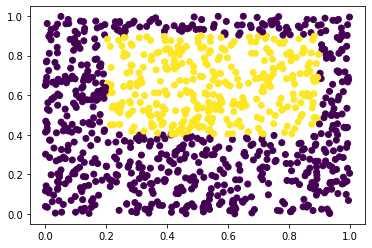

In [139]:
#Creating the required dataset
x = torch.rand(1000,2) 
y = torch.zeros(1000,1) 

for index,data_points in enumerate(x):
    #assigning label according to the given criteria
    if data_points[0]>0.2 and data_points[0]<0.9  and data_points[1]>0.4 and data_points[1]<0.9 :
        y[index] = 1


data = torch.cat((x,y),dim = 1) 

train = data[:800,:]
print(train.size())

valid = data[800:900,:]
print(valid.size())

test = data[900:,:]
print(test.size())

plt.scatter(data[:,0], data[:,1], c=data[:,2])


***We need 4 lines to seperate the positive ans negative examples in this dataset. So theoritically we need minimum 4 hidden units to classify this problem. so we are varying the number of hidden unit from 2 to 4 to see the effect it has on the result***

/usr/local/lib/python3.8/dist-packages/numpy/core/shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


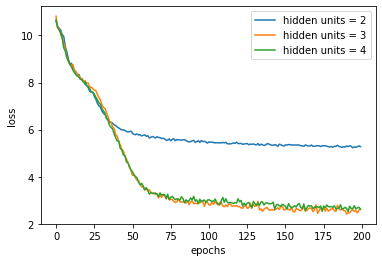

In [140]:
hidden_units = [2,3,4]
acc_list = {}
for hid in hidden_units:
    params = init_mlp(2, hid, 1)

    loss, acc, valid_acc, test_acc,arts = train_model(params, train, eta=0.05, n_epochs=200, show_every_epoch_result=False)
    #storing the accuracy list
    acc_list[hid] = acc 
    #ploting the loss
    plt.plot(range(200), loss, label = f'hidden units = {hid}')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend(loc = 'best')


***Here we can observe that as the number of hidden units is reaching close to the theoritical minimum, the learning loss is decreasing further. Which means that the other models are not really fully capable of classifing the problem***

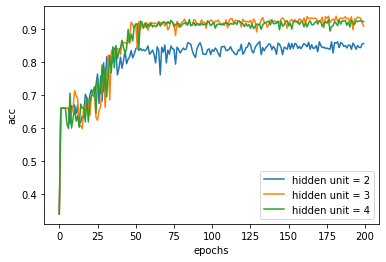

In [141]:
for hid in acc_list:
    plt.plot(range(200), acc_list[hid], label=f'hidden unit = {hid}')

    plt.xlabel('epochs')
    plt.ylabel('acc')
    plt.legend(loc = 'best')

***Here we see that the accyracy is also increasing as the number of hidden units is increasing towards the theoritical minimum. Also the accuracy is increasing as the number of hidden units is going close towards the theoritical minimum***

### [Advanced] Exercise 22

Implement another (or all) alternative optimizers that we have seen in the lecture. Plot the loss curves of them on a same plot together with vanilla SGD.

***We are implementing here the SGD with momentum optimizer***

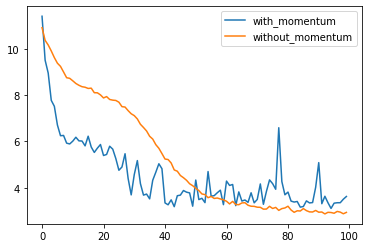

In [142]:
def train_model_with_SGD_with_momentum(params, data, eta=0.05, n_epochs=1, batch_size=16):
    n_data = data.shape[0]
    n_iterations = n_data // batch_size
    
    #parameters for SGD momentum optimizer
    mn = [0,0,0,0]
    gamma = 0.9
    ### BEGIN SOLUTION
    # 1. Zero the gradients of each of the parameters because .bacward() accumulates them
    with torch.no_grad():
        for param in params:
            if param.grad is not None:
                param.grad.zero_()
                            
    # 2. Run the forward pass on the model
    loss_series = []
    acc_series = []
    for epoch in range(n_epochs):
        #randomizing the data
        r = torch.randperm(data.size(0))
        data = data[r]
        
        #calculate the accuracy of the model and store it
        acc_series.append(float(score_model(params, data)))
        running_loss =0 
        
        for iteration in range(n_iterations):
            
            #select mini batch
            try:
                train = data[batch_size * iteration:iteration*batch_size + batch_size]
            
            except:
                train = data[batch_size * iteration:]
            
            
            for param in params:
                if param.grad is not None:
                    param.grad.zero_()
            
            #to make the shape of ypred same as y
            y_pred = mlp(train[:,:2], params).squeeze()
            # 3. Compute the error
            loss = bce(y_pred, train[:,2])
            running_loss+=loss
            
            # 4. Compute the gradients
            loss.backward()
              
            # 5. Update the parameters using their gradients with momentum
            params = list(params)
            with torch.no_grad():
                
                for i in range(len(params)):
                    mn[i] = gamma*mn[i] +eta *params[i].grad
                    
                    params[i] -= mn[i]
                    params[i].grad.zero_()
            
        running_loss = running_loss/n_iterations
        loss_series.append(float(running_loss))
    
    return loss_series, acc_series

### END SOLUTION


### previous SGD
def train_model(params, data, eta=0.05, n_epochs=1, batch_size=16):
    n_data = data.shape[0]
    n_iterations = n_data // batch_size
    
    ### BEGIN SOLUTION
    # 1. Zero the gradients of each of the parameters because .bacward() accumulates them
    with torch.no_grad():
        for param in params:
            if param.grad is not None:
                param.grad.zero_()
                            
    # 2. Run the forward pass on the model
    loss_series = []
    acc_series = []
    for epoch in range(n_epochs):
        r = torch.randperm(data.size(0))
        data = data[r]
        
        acc_series.append(float(score_model(params, data)))
        running_loss=0
        for iteration in range(n_iterations):
            
            try:
                train = data[batch_size * iteration:iteration*batch_size + batch_size]
            
            except:
                train = data[batch_size * iteration:]
            
            
            for param in params:
                if param.grad is not None:
                    param.grad.zero_()
            y_pred = mlp(train[:,:2], params).squeeze()
            # 3. Compute the error
            loss = bce(y_pred, train[:,2])
            running_loss+=float(loss)
            # 4. Compute the gradients
            loss.backward()
              
            # 5. Update the parameters using their gradients
            with torch.no_grad():
                for param in params:
                    
                    param -= eta * param.grad
                    param.grad.zero_()
        loss_series.append(running_loss/n_iterations)
    
    return loss_series,acc_series
    

### END SOLUTION

####

params = init_mlp(2, 4, 1)
loss2,acc2 = train_model(params, train, eta=0.05, n_epochs=100, batch_size = 16)

params = init_mlp(2, 4, 1)
loss1,acc1 = train_model_with_SGD_with_momentum(params, train, eta=0.05, n_epochs=100, batch_size = 16)

#params = backup_params           

plt.plot(loss1, label = 'with_momentum')
plt.plot(loss2, label = 'without_momentum')
plt.legend(loc='best')

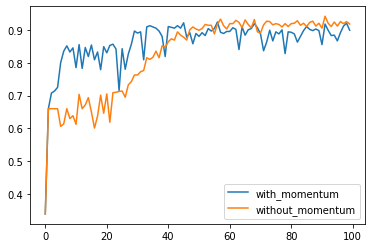

In [143]:
plt.plot(acc1, label = 'with_momentum')
plt.plot(acc2, label = 'without_momentum')
plt.legend(loc='best')

**We can notice in the plots that the SGD with momentum optimizer learns rapidly at the begining of the training and saturates after that.**